In [ ]:
import torchvision
import torchvision.transforms as transforms
from torchvision import datasets

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader

import matplotlib.pyplot as plt
import numpy as np
import random
import os

os.makedirs('./images/rgan', exist_ok=True)

In [ ]:
np.random.seed(1234)
torch.manual_seed(1234)
random.seed(1234)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
BATCH_SIZE  = 64
N_EPOCHS = 100
IMAGE_SIZE = 64
LATENT_DIM = 100
N_SHOW = 5

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
transforms = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))
    ])

In [ ]:
data = datasets.CIFAR10('.data',
                        train=True,
                        download=True,
                        transform=transforms,
                        )

Files already downloaded and verified


In [ ]:
iterator = DataLoader(data,
                      batch_size=BATCH_SIZE,
                      shuffle=True
                     )

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [ ]:
class Generator(nn.Module):
    def __init__(self, latent_dim, image_size):
        super().__init__()

        self.main = nn.Sequential(

            nn.ConvTranspose2d(in_channels=latent_dim,
                               out_channels=image_size*8,
                               kernel_size=4,
                               stride=1,
                               padding=0,
                               bias=False),
            nn.BatchNorm2d(image_size*8),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(in_channels=image_size*8,
                               out_channels=image_size*4,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(image_size*4),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(in_channels=image_size*4,
                               out_channels=image_size*2,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(image_size*2),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(in_channels=image_size*2,
                               out_channels=image_size,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(image_size),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(in_channels=image_size,
                               out_channels=3,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            #no tanh!
            #nn.Tanh(),

        )

    def forward(self, x):
        return self.main(x)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, image_size):
        super().__init__()

        self.main = nn.Sequential(

            nn.Conv2d(in_channels=3,
                      out_channels=image_size,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=image_size,
                      out_channels=image_size*2,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(image_size*2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=image_size*2,
                      out_channels=image_size*4,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(image_size*4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=image_size*4,
                      out_channels=image_size*8,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(image_size*8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=image_size*8,
                      out_channels=1,
                      kernel_size=4,
                      stride=1,
                      padding=0,
                      bias=False),

            #no sigmoid!
            #nn.Sigmoid(),

        )

    def forward(self, x):
        return self.main(x).view(-1, 1).squeeze(1)

In [ ]:
G = Generator(LATENT_DIM, IMAGE_SIZE).to(device)

In [ ]:
D = Discriminator(IMAGE_SIZE).to(device)

In [ ]:
G.apply(weights_init)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  )
)

In [ ]:
D.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)

In [ ]:
criterion = nn.BCEWithLogitsLoss()

In [ ]:
G_optimizer = optim.Adam(G.parameters(), lr=0.0001, betas=(0.5, 0.999))
D_optimizer = optim.Adam(D.parameters(), lr=0.0001, betas=(0.5, 0.999))

| Epoch: 001 | D(x): 9.466 / 9.341 | D(G(z)): 8.320 / 8.486 | D_error: 0.217 | G_error: 7.053 |


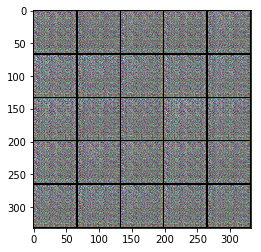

| Epoch: 002 | D(x): 6.360 / 6.271 | D(G(z)): 5.501 / 5.411 | D_error: 0.200 | G_error: 7.128 |


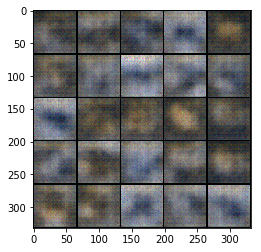

| Epoch: 003 | D(x): 2.284 / 2.662 | D(G(z)): 1.797 / 1.232 | D_error: 0.749 | G_error: 11.968 |


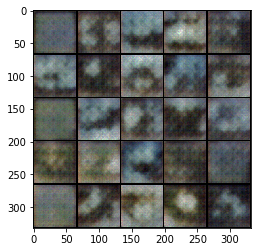

| Epoch: 004 | D(x): 0.839 / 0.689 | D(G(z)): -0.038 / -0.047 | D_error: 0.305 | G_error: 6.389 |


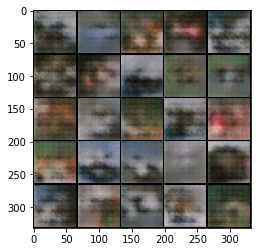

| Epoch: 005 | D(x): -1.901 / -1.984 | D(G(z)): -3.022 / -2.939 | D_error: 0.270 | G_error: 7.808 |


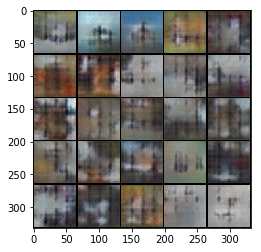

| Epoch: 006 | D(x): -2.131 / -1.908 | D(G(z)): -2.540 / -2.943 | D_error: 1.021 | G_error: 8.646 |


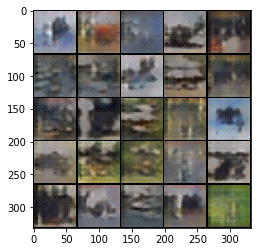

| Epoch: 007 | D(x): -2.938 / -2.941 | D(G(z)): -3.687 / -3.914 | D_error: 0.446 | G_error: 8.046 |


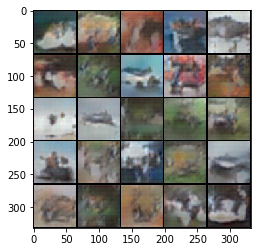

| Epoch: 008 | D(x): -4.217 / -4.611 | D(G(z)): -4.757 / -5.543 | D_error: 0.710 | G_error: 7.789 |


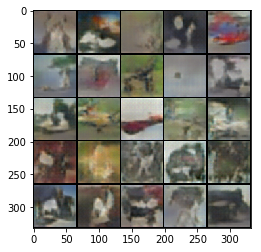

| Epoch: 009 | D(x): -4.247 / -4.171 | D(G(z)): -5.079 / -5.340 | D_error: 0.250 | G_error: 9.579 |


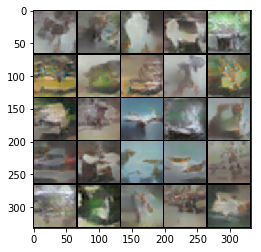

| Epoch: 010 | D(x): -4.219 / -4.388 | D(G(z)): -4.869 / -5.523 | D_error: 0.432 | G_error: 9.266 |


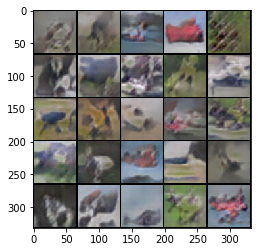

| Epoch: 011 | D(x): -4.298 / -4.441 | D(G(z)): -5.443 / -5.165 | D_error: 0.288 | G_error: 6.151 |


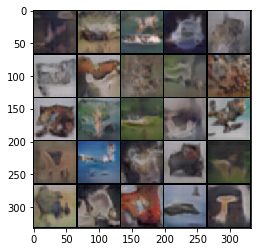

| Epoch: 012 | D(x): -4.805 / -4.290 | D(G(z)): -5.514 / -5.672 | D_error: 0.350 | G_error: 11.527 |


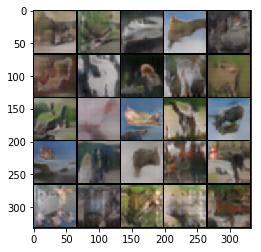

| Epoch: 013 | D(x): -5.238 / -5.395 | D(G(z)): -5.994 / -6.306 | D_error: 0.376 | G_error: 7.515 |


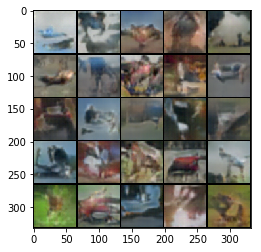

| Epoch: 014 | D(x): -4.781 / -5.200 | D(G(z)): -5.667 / -5.890 | D_error: 0.374 | G_error: 5.973 |


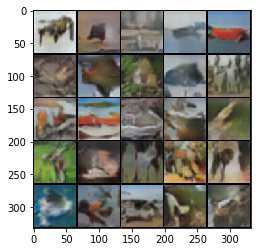

| Epoch: 015 | D(x): -4.028 / -4.722 | D(G(z)): -5.072 / -5.369 | D_error: 0.240 | G_error: 5.606 |


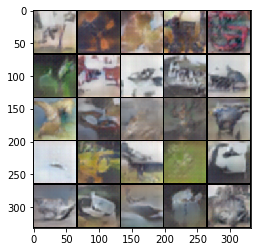

| Epoch: 016 | D(x): -4.912 / -4.692 | D(G(z)): -5.488 / -6.337 | D_error: 0.555 | G_error: 14.161 |


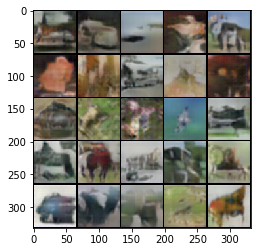

| Epoch: 017 | D(x): -6.056 / -6.278 | D(G(z)): -6.781 / -6.910 | D_error: 0.325 | G_error: 5.477 |


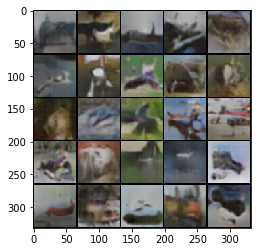

| Epoch: 018 | D(x): -6.630 / -6.325 | D(G(z)): -7.170 / -7.866 | D_error: 0.601 | G_error: 13.082 |


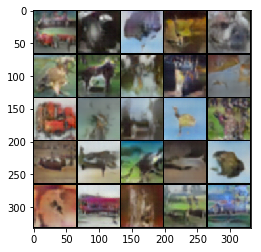

| Epoch: 019 | D(x): -6.062 / -6.462 | D(G(z)): -6.921 / -7.218 | D_error: 0.170 | G_error: 6.320 |


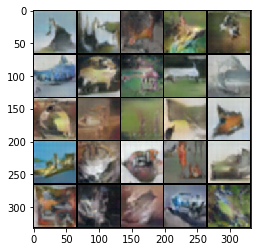

| Epoch: 020 | D(x): -7.232 / -7.132 | D(G(z)): -7.931 / -8.216 | D_error: 0.415 | G_error: 8.890 |


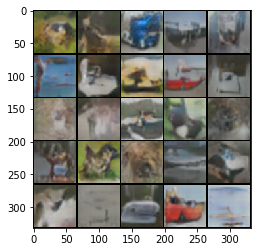

| Epoch: 021 | D(x): -6.580 / -6.768 | D(G(z)): -8.045 / -7.792 | D_error: 0.622 | G_error: 8.346 |


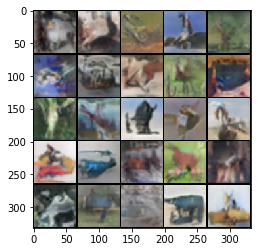

| Epoch: 022 | D(x): -6.229 / -6.683 | D(G(z)): -7.031 / -7.617 | D_error: 0.173 | G_error: 7.596 |


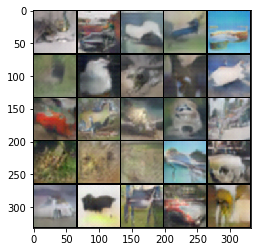

| Epoch: 023 | D(x): -7.058 / -7.093 | D(G(z)): -7.582 / -8.228 | D_error: 0.617 | G_error: 9.249 |


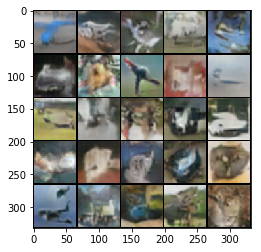

| Epoch: 024 | D(x): -6.367 / -6.384 | D(G(z)): -6.812 / -7.217 | D_error: 0.772 | G_error: 6.875 |


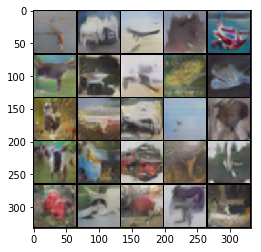

| Epoch: 025 | D(x): -7.847 / -7.979 | D(G(z)): -8.586 / -8.906 | D_error: 0.256 | G_error: 7.587 |


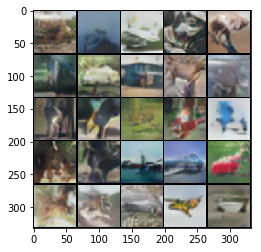

| Epoch: 026 | D(x): -7.376 / -7.420 | D(G(z)): -8.503 / -8.509 | D_error: 0.184 | G_error: 8.878 |


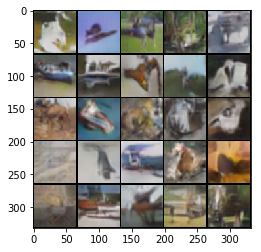

| Epoch: 027 | D(x): -7.672 / -7.859 | D(G(z)): -8.538 / -8.689 | D_error: 0.186 | G_error: 6.839 |


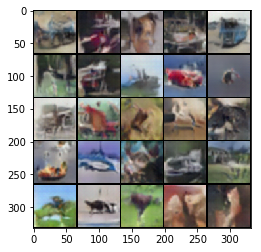

| Epoch: 028 | D(x): -7.554 / -7.801 | D(G(z)): -8.727 / -8.601 | D_error: 0.243 | G_error: 6.623 |


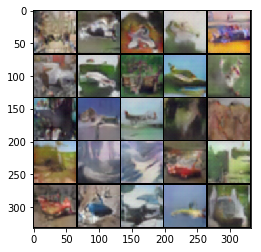

| Epoch: 029 | D(x): -7.699 / -7.317 | D(G(z)): -8.139 / -8.498 | D_error: 0.745 | G_error: 9.676 |


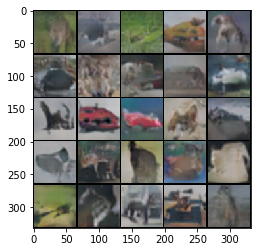

| Epoch: 030 | D(x): -7.572 / -7.382 | D(G(z)): -8.807 / -8.094 | D_error: 0.217 | G_error: 5.969 |


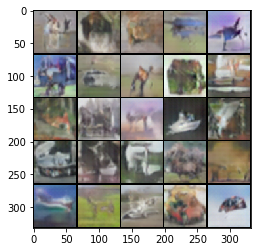

| Epoch: 031 | D(x): -8.445 / -8.444 | D(G(z)): -9.045 / -9.218 | D_error: 0.439 | G_error: 6.390 |


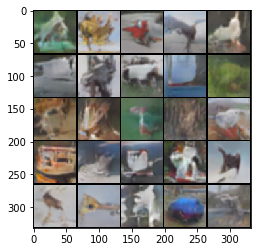

| Epoch: 032 | D(x): -7.590 / -7.632 | D(G(z)): -8.327 / -8.630 | D_error: 0.278 | G_error: 8.074 |


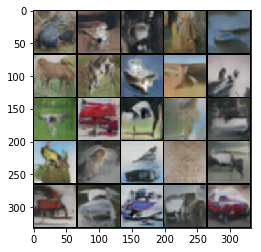

| Epoch: 033 | D(x): -7.898 / -7.699 | D(G(z)): -8.644 / -8.912 | D_error: 0.248 | G_error: 9.921 |


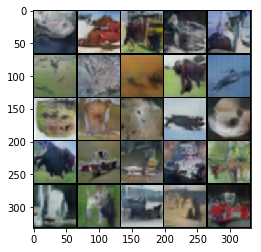

| Epoch: 034 | D(x): -7.872 / -8.248 | D(G(z)): -9.216 / -9.214 | D_error: 0.367 | G_error: 7.843 |


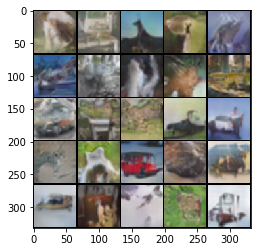

| Epoch: 035 | D(x): -7.789 / -7.264 | D(G(z)): -8.239 / -8.641 | D_error: 0.734 | G_error: 11.436 |


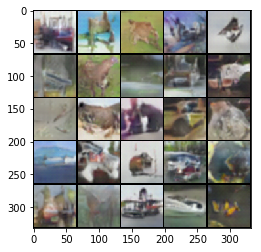

| Epoch: 036 | D(x): -7.755 / -7.588 | D(G(z)): -9.065 / -8.693 | D_error: 0.309 | G_error: 8.957 |


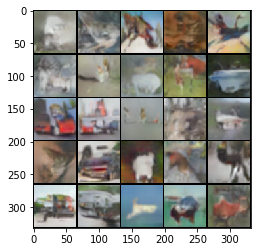

| Epoch: 037 | D(x): -7.542 / -7.766 | D(G(z)): -8.732 / -8.756 | D_error: 0.159 | G_error: 8.011 |


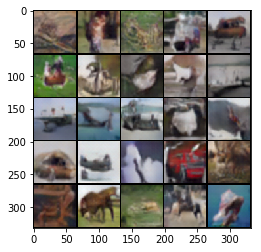

| Epoch: 038 | D(x): -7.162 / -7.369 | D(G(z)): -8.506 / -8.325 | D_error: 0.364 | G_error: 7.745 |


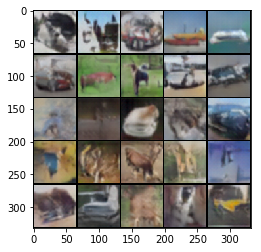

| Epoch: 039 | D(x): -7.860 / -7.877 | D(G(z)): -8.774 / -8.951 | D_error: 0.157 | G_error: 8.767 |


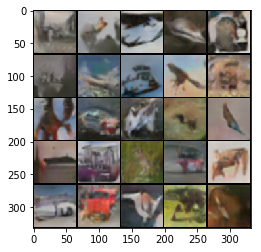

| Epoch: 040 | D(x): -8.013 / -7.811 | D(G(z)): -9.074 / -8.716 | D_error: 0.106 | G_error: 7.374 |


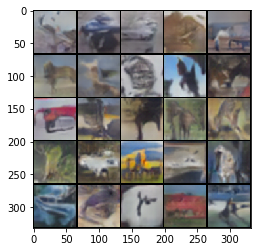

| Epoch: 041 | D(x): -8.152 / -8.058 | D(G(z)): -9.155 / -9.007 | D_error: 0.119 | G_error: 7.727 |


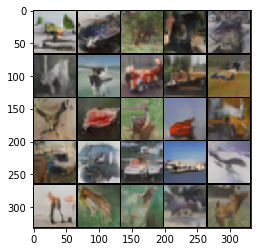

| Epoch: 042 | D(x): -7.311 / -7.362 | D(G(z)): -7.946 / -8.356 | D_error: 0.353 | G_error: 8.047 |


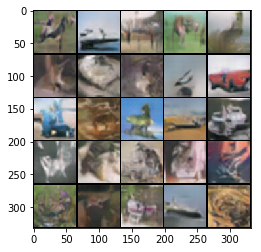

| Epoch: 043 | D(x): -7.429 / -7.613 | D(G(z)): -8.674 / -8.353 | D_error: 0.238 | G_error: 6.169 |


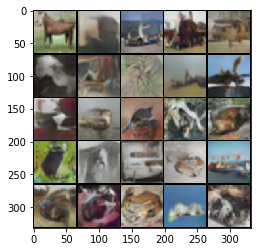

| Epoch: 044 | D(x): -7.730 / -7.241 | D(G(z)): -8.290 / -8.306 | D_error: 0.503 | G_error: 8.657 |


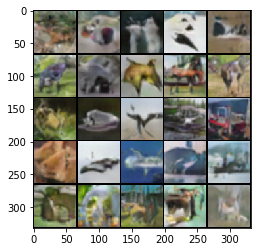

| Epoch: 045 | D(x): -7.535 / -7.300 | D(G(z)): -8.804 / -8.092 | D_error: 0.239 | G_error: 6.549 |


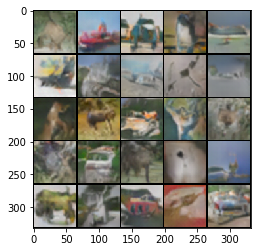

| Epoch: 046 | D(x): -7.528 / -7.353 | D(G(z)): -8.531 / -8.489 | D_error: 0.123 | G_error: 9.230 |


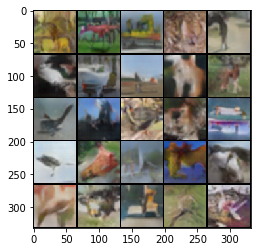

| Epoch: 047 | D(x): -6.758 / -7.043 | D(G(z)): -7.312 / -7.985 | D_error: 0.506 | G_error: 7.629 |


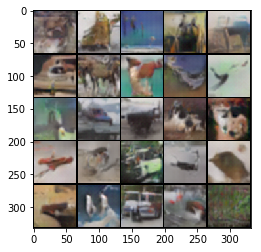

| Epoch: 048 | D(x): -6.994 / -6.496 | D(G(z)): -7.598 / -7.747 | D_error: 0.398 | G_error: 10.261 |


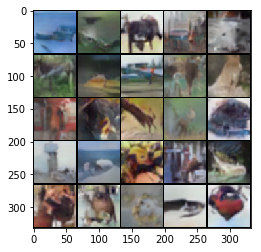

| Epoch: 049 | D(x): -7.005 / -6.829 | D(G(z)): -7.955 / -7.713 | D_error: 0.126 | G_error: 7.201 |


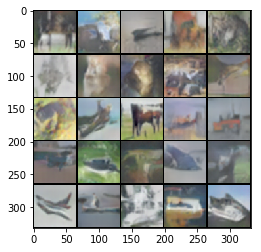

| Epoch: 050 | D(x): -6.595 / -6.976 | D(G(z)): -7.489 / -7.672 | D_error: 0.117 | G_error: 5.873 |


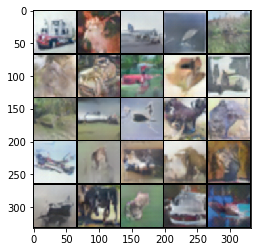

| Epoch: 051 | D(x): -6.514 / -6.780 | D(G(z)): -7.544 / -7.750 | D_error: 0.096 | G_error: 7.853 |


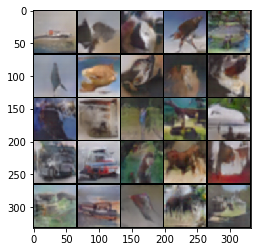

| Epoch: 052 | D(x): -6.624 / -6.659 | D(G(z)): -7.659 / -7.608 | D_error: 0.102 | G_error: 7.670 |


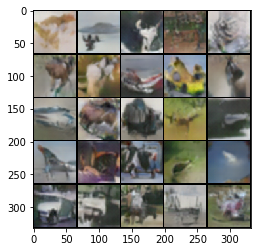

| Epoch: 053 | D(x): -6.877 / -6.909 | D(G(z)): -7.645 / -7.778 | D_error: 0.205 | G_error: 7.061 |


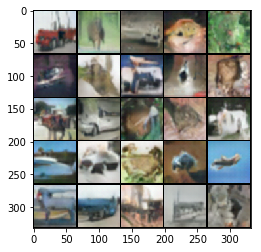

| Epoch: 054 | D(x): -7.041 / -7.313 | D(G(z)): -7.901 / -8.215 | D_error: 0.141 | G_error: 7.360 |


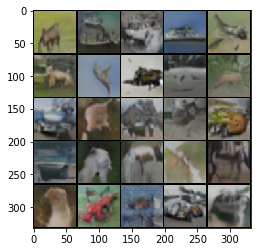

| Epoch: 055 | D(x): -7.375 / -7.511 | D(G(z)): -8.436 / -8.481 | D_error: 0.149 | G_error: 7.878 |


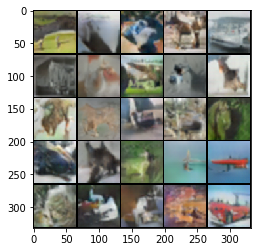

| Epoch: 056 | D(x): -6.819 / -7.281 | D(G(z)): -7.879 / -7.860 | D_error: 0.146 | G_error: 5.111 |


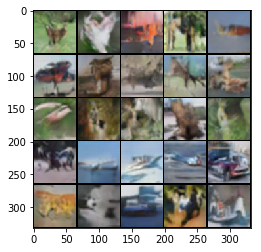

| Epoch: 057 | D(x): -7.449 / -7.049 | D(G(z)): -8.411 / -8.448 | D_error: 0.071 | G_error: 11.618 |


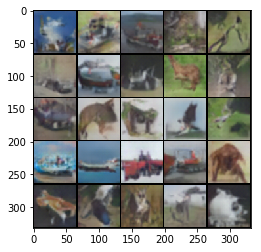

| Epoch: 058 | D(x): -6.820 / -6.832 | D(G(z)): -7.952 / -7.988 | D_error: 0.122 | G_error: 9.372 |


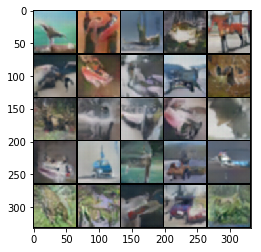

| Epoch: 059 | D(x): -6.116 / -6.551 | D(G(z)): -7.361 / -7.184 | D_error: 0.251 | G_error: 5.452 |


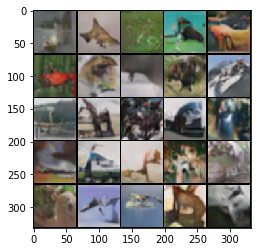

| Epoch: 060 | D(x): -6.573 / -6.704 | D(G(z)): -7.822 / -7.717 | D_error: 0.225 | G_error: 8.180 |


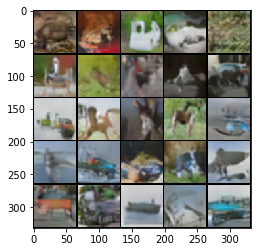

| Epoch: 061 | D(x): -6.240 / -6.447 | D(G(z)): -7.582 / -7.258 | D_error: 0.346 | G_error: 6.673 |


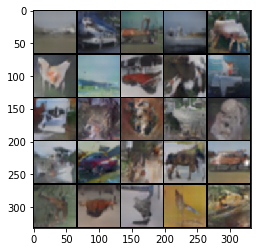

| Epoch: 062 | D(x): -6.909 / -7.146 | D(G(z)): -7.942 / -8.099 | D_error: 0.079 | G_error: 7.706 |


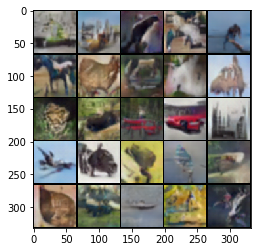

| Epoch: 063 | D(x): -6.623 / -6.821 | D(G(z)): -7.329 / -7.719 | D_error: 0.257 | G_error: 7.278 |


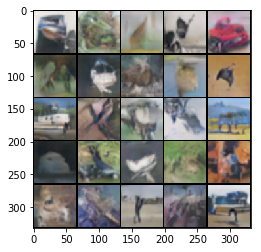

| Epoch: 064 | D(x): -7.228 / -7.106 | D(G(z)): -7.835 / -8.101 | D_error: 0.436 | G_error: 8.056 |


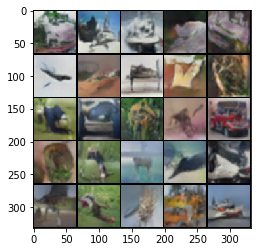

| Epoch: 065 | D(x): -6.653 / -6.723 | D(G(z)): -7.573 / -7.803 | D_error: 0.098 | G_error: 8.742 |


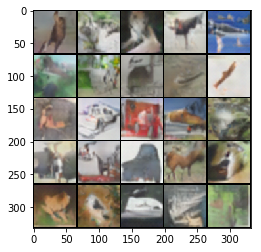

| Epoch: 066 | D(x): -6.559 / -6.762 | D(G(z)): -7.266 / -7.399 | D_error: 0.247 | G_error: 5.427 |


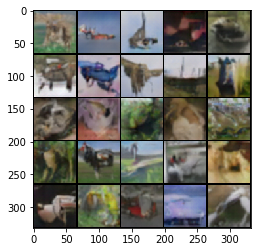

| Epoch: 067 | D(x): -7.266 / -6.827 | D(G(z)): -7.924 / -8.037 | D_error: 0.339 | G_error: 9.873 |


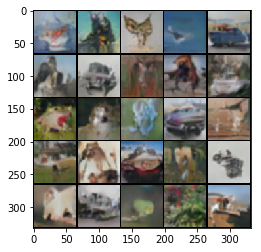

| Epoch: 068 | D(x): -7.445 / -7.109 | D(G(z)): -8.048 / -8.019 | D_error: 0.413 | G_error: 7.385 |


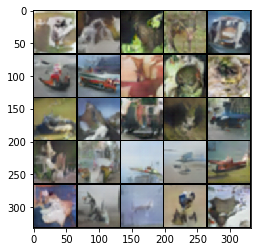

| Epoch: 069 | D(x): -6.291 / -6.560 | D(G(z)): -7.385 / -7.389 | D_error: 0.101 | G_error: 6.754 |


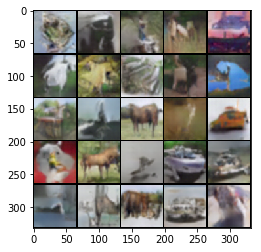

| Epoch: 070 | D(x): -6.446 / -6.535 | D(G(z)): -7.587 / -7.473 | D_error: 0.114 | G_error: 7.586 |


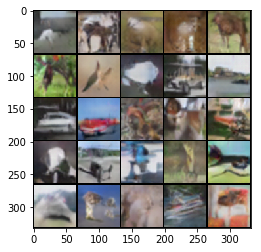

| Epoch: 071 | D(x): -6.058 / -6.130 | D(G(z)): -7.029 / -7.189 | D_error: 0.080 | G_error: 8.546 |


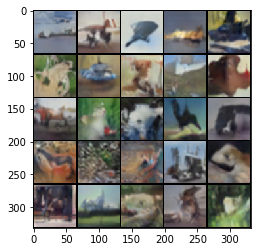

| Epoch: 072 | D(x): -6.736 / -6.743 | D(G(z)): -7.919 / -7.798 | D_error: 0.137 | G_error: 8.501 |


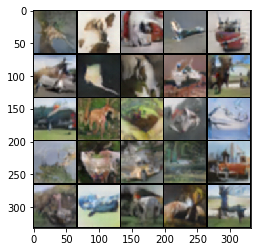

| Epoch: 073 | D(x): -6.659 / -6.317 | D(G(z)): -7.446 / -7.315 | D_error: 0.158 | G_error: 8.082 |


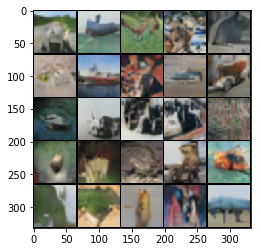

| Epoch: 074 | D(x): -6.009 / -6.304 | D(G(z)): -6.995 / -7.168 | D_error: 0.081 | G_error: 7.032 |


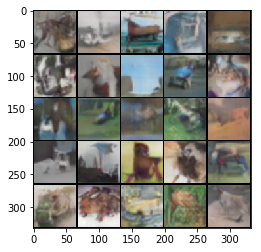

| Epoch: 075 | D(x): -6.073 / -5.682 | D(G(z)): -7.008 / -6.943 | D_error: 0.098 | G_error: 10.287 |


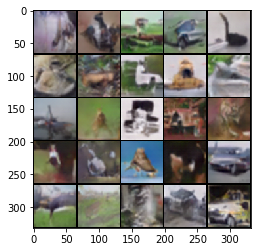

| Epoch: 076 | D(x): -6.118 / -6.208 | D(G(z)): -7.048 / -7.133 | D_error: 0.065 | G_error: 7.501 |


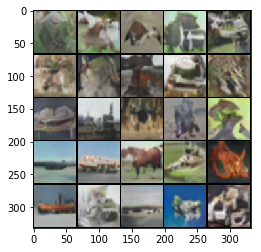

| Epoch: 077 | D(x): -6.154 / -6.245 | D(G(z)): -7.304 / -7.210 | D_error: 0.114 | G_error: 7.798 |


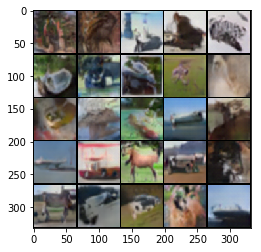

| Epoch: 078 | D(x): -6.145 / -6.081 | D(G(z)): -7.274 / -7.188 | D_error: 0.102 | G_error: 8.964 |


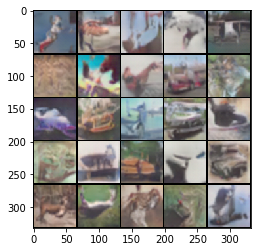

| Epoch: 079 | D(x): -5.790 / -6.066 | D(G(z)): -6.913 / -6.722 | D_error: 0.110 | G_error: 5.590 |


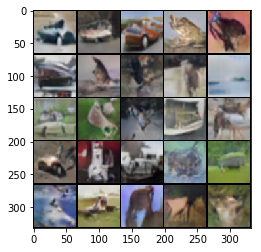

| Epoch: 080 | D(x): -6.009 / -6.010 | D(G(z)): -6.812 / -7.021 | D_error: 0.171 | G_error: 8.161 |


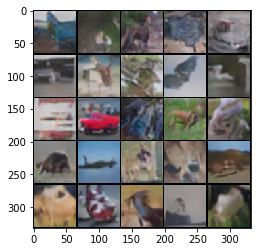

| Epoch: 081 | D(x): -6.137 / -6.029 | D(G(z)): -6.884 / -6.751 | D_error: 0.230 | G_error: 5.998 |


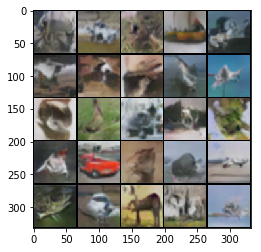

| Epoch: 082 | D(x): -5.940 / -6.204 | D(G(z)): -6.920 / -6.790 | D_error: 0.077 | G_error: 5.129 |


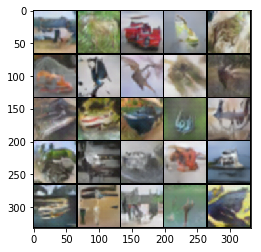

| Epoch: 083 | D(x): -5.659 / -5.456 | D(G(z)): -6.673 / -6.648 | D_error: 0.064 | G_error: 9.688 |


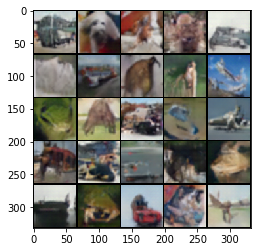

In [ ]:
for epoch in range(1, N_EPOCHS+1):

    for _ in range(len(iterator)):

        #labels
        #real_labels = torch.ones(x.shape[0],).to(device)
        #fake_labels = torch.zeros(x.shape[0],).to(device)

        #========
        # TRAIN DISCRIMINATOR
        #=======

        #1. train with real data

        D.zero_grad()

        #get data and place on GPU
        x, _ = next(iter(iterator))

        x = x.to(device)

        #generate noise
        z = torch.randn(x.shape[0], LATENT_DIM, 1, 1).to(device)

        #generate images
        generated_images = G(z).detach()

        pred_real_1 = D(x)

        #2. train with fake data

        pred_fake_1 = D(generated_images)

        #D_error_fake = criterion(pred_fake_1, fake_labels)

        #D_error_fake.backward()

        D_error = torch.mean((pred_real_1 - torch.mean(pred_fake_1) - 1) ** 2) + torch.mean((pred_fake_1 - torch.mean(pred_real_1) + 1) ** 2)

        D_error.backward()

        D_optimizer.step()

        #=========
        # TRAIN GENERATOR
        #=========

        G.zero_grad()

        x, _ = next(iter(iterator))

        x = x.to(device)

        z = torch.randn(x.shape[0], LATENT_DIM, 1, 1).to(device)

        generated_images = G(z)

        pred_real_2 = D(x)

        pred_fake_2 = D(generated_images)

        G_error = torch.mean((pred_real_2 - torch.mean(pred_fake_2) + 1) ** 2) + torch.mean((pred_fake_2 - torch.mean(pred_real_2) - 1) ** 2)

        #G_error = criterion(pred_fake_2 - pred_real, real_labels)

        G_error.backward()

        G_optimizer.step()

    if (epoch % 1) == 0:

        #generate batch of fake images
        z = torch.randn(N_SHOW*N_SHOW, LATENT_DIM, 1, 1).to(device)

        with torch.no_grad():
            generated_images = G(z)

        #display N_SHOW images
        print(f'| Epoch: {epoch:03} | D(x): {pred_real_1.mean().item():.03f} / {pred_real_2.mean().item():.03f} | D(G(z)): {pred_fake_1.mean().item():.03f} / {pred_fake_2.mean().item():.03f} | D_error: {D_error.item():.03f} | G_error: {G_error.item():.03f} |')


        torchvision.utils.save_image(generated_images,
                                     f'images/rgan/epoch{epoch:03}.png',
                                     nrow=N_SHOW,
                                     normalize=True)

        img = plt.imread(f'images/rgan/epoch{epoch:03}.png')
        plt.imshow(img)
        plt.show()